<a href="https://colab.research.google.com/github/faisu6339-glitch/Real_World-Projects/blob/main/cassava(LMFRnet).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mount Drive & Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install -q tensorflow pandas scikit-learn matplotlib

import os
import json
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import MobileNetV3Small

print("TensorFlow:", tf.__version__)


TensorFlow: 2.20.0


In [ ]:
BASE_PATH = "/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset"

TRAIN_CSV = BASE_PATH + "/Train/Train.csv"
TRAIN_DIR = BASE_PATH + "/Train/Train_Images"

TEST_CSV = BASE_PATH + "/Test/Test.csv"
TEST_DIR = BASE_PATH + "/Test/Test_images"

LABEL_JSON = BASE_PATH + "/label_num_to_disease_map.json"

In [ ]:
train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

with open(LABEL_JSON, "r") as f:
    label_map = json.load(f)

print("Train data:")
print(train_df.head())

print("Test data:")
print(test_df.head())

print("Label map:")
print(label_map)

print("Train columns:", train_df.columns)
print("Test columns:", test_df.columns)

Train data:
               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4
Test data:
               ID  Labels
0  2595356168.jpg       3
1   794817264.jpg       0
2  4270972443.jpg       4
3  3540803278.jpg       0
4  2142522228.jpg       3
Label map:
{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}
Train columns: Index(['ID', 'Labels'], dtype='object')
Test columns: Index(['ID', 'Labels'], dtype='object')


In [ ]:
train_df["Labels"] = train_df["Labels"].astype(int)
test_df["Labels"] = test_df["Labels"].astype(int)

num_classes = len(label_map)

print("Number of classes:", num_classes)
print("Train class count:")
print(train_df["Labels"].value_counts())

Number of classes: 5
Train class count:
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#Prepare CSV paths

In [ ]:
train_df["path"] = train_df["ID"].apply(lambda x: os.path.join(TRAIN_DIR, x))
test_df["path"] = test_df["ID"].apply(lambda x: os.path.join(TEST_DIR, x))

train_df["Labels"] = train_df["Labels"].astype(str)
test_df["Labels"] = test_df["Labels"].astype(str)

#Counts the images using the function

In [ ]:
def count_images(folder):
    return len(os.listdir(folder))
print("Train images:", count_images(TRAIN_DIR))
print("Test images:", count_images(TEST_DIR))

Train images: 4022
Test images: 1000


Conversion the Numbers to Labels Names

In [ ]:
for k, v in label_map.items():
    print(f"Label {k} → {v}")

Label 0 → CBB
Label 1 → CBSD
Label 2 → CGM
Label 3 → CMD
Label 4 → Healthy


Class Distribution

In [ ]:
counts = train_df["Labels"].value_counts().sort_index()

for label, count in counts.items():
    print(f"{label_map[str(label)]} → {count}")

CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [ ]:
counts = train_df["Labels"].value_counts().sort_index()
names = [label_map[str(i)] for i in counts.index]
values = counts.values

Plotting the Barplot to see all the class image

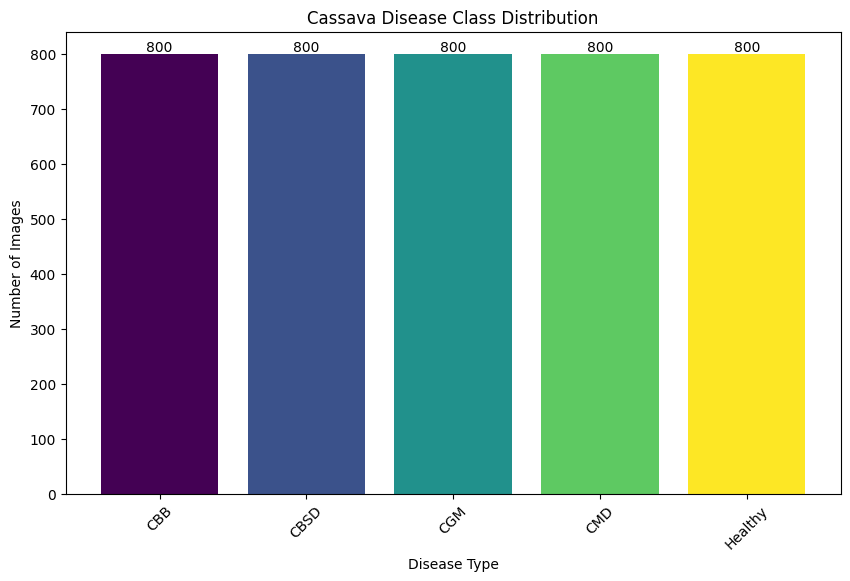

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

colors = plt.cm.viridis(np.linspace(0, 1, len(names)))

plt.figure(figsize=(10,6))

plt.bar(names, values, color=colors)

plt.title("Cassava Disease Class Distribution")
plt.xlabel("Disease Type")
plt.ylabel("Number of Images")

plt.xticks(rotation=45)

for i, v in enumerate(values):
    plt.text(i, v + 5, str(v), ha='center')

plt.show()

Function to Access the single images

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_one_image(class_id):
    row = train_df[train_df["Labels"] == class_id].iloc[0]

    img_path = os.path.join(TRAIN_DIR, row["ID"])
    img = Image.open(img_path)

    plt.imshow(img)
    plt.title(label_map[str(class_id)])
    plt.axis("off")
    plt.show()

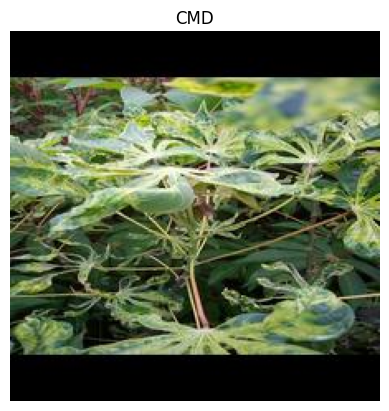

In [ ]:
show_one_image("3")

Function to Access 3 random images from EACH class

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_random_images_per_class(n=3):
    classes = sorted(train_df["Labels"].unique())

    plt.figure(figsize=(15, len(classes) * 3))

    for i, class_id in enumerate(classes):
        rows = train_df[train_df["Labels"] == class_id].sample(n)

        for j, (_, row) in enumerate(rows.iterrows()):
            img_path = os.path.join(TRAIN_DIR, row["ID"])
            img = Image.open(img_path)

            plt.subplot(len(classes), n, i*n + j + 1)
            plt.imshow(img)
            plt.title(label_map[str(class_id)])
            plt.axis("off")

    plt.tight_layout()
    plt.show()

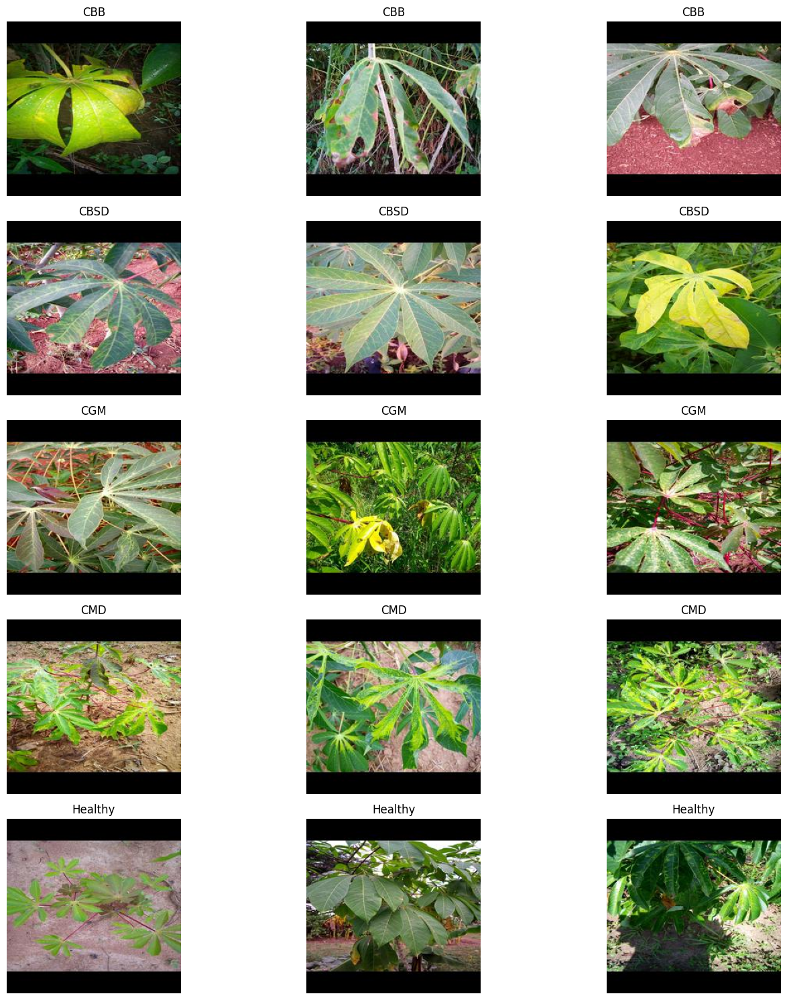

In [ ]:
show_random_images_per_class(n=3)

Image preprocessing

Import Libraries

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

Applying image preprocessing on CGM Disease

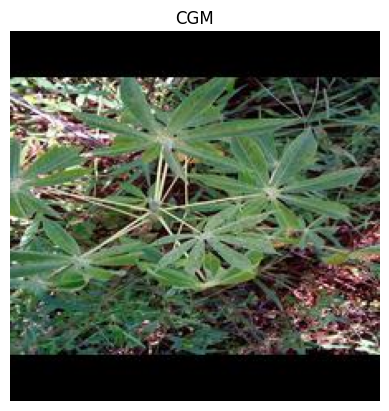

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# get one row
row = train_df.iloc[2]

# image path
image_path = os.path.join(TRAIN_DIR, row["ID"])

# label
label_id = row["Labels"]
label_name = label_map[str(label_id)]

# load image
img = Image.open(image_path)

# show image with ONLY class name
plt.imshow(img)
plt.title(label_name)
plt.axis("off")
plt.show()

Load image

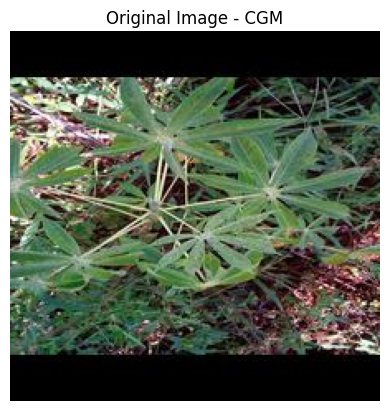

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title(f"Original Image - {label_name}")
plt.axis("off")
plt.show()

Image preprocessing functions in one grid

In [ ]:
import cv2
import numpy as np

# resize
resized = cv2.resize(img, (224, 224))

# grayscale
gray = cv2.cvtColor(resized, cv2.COLOR_RGB2GRAY)

# gaussian blur
gaussian_blur = cv2.GaussianBlur(resized, (5, 5), 0)

# sharpening
kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])
sharpened = cv2.filter2D(resized, -1, kernel)

# CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)

# canny edge
edges = cv2.Canny(gray, 100, 200)

# sobel
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel = cv2.magnitude(sobel_x, sobel_y)
sobel = np.uint8(np.clip(sobel, 0, 255))

# threshold
_, threshold = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)

# adaptive threshold
adaptive_threshold = cv2.adaptiveThreshold(
    gray, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    11, 2
)

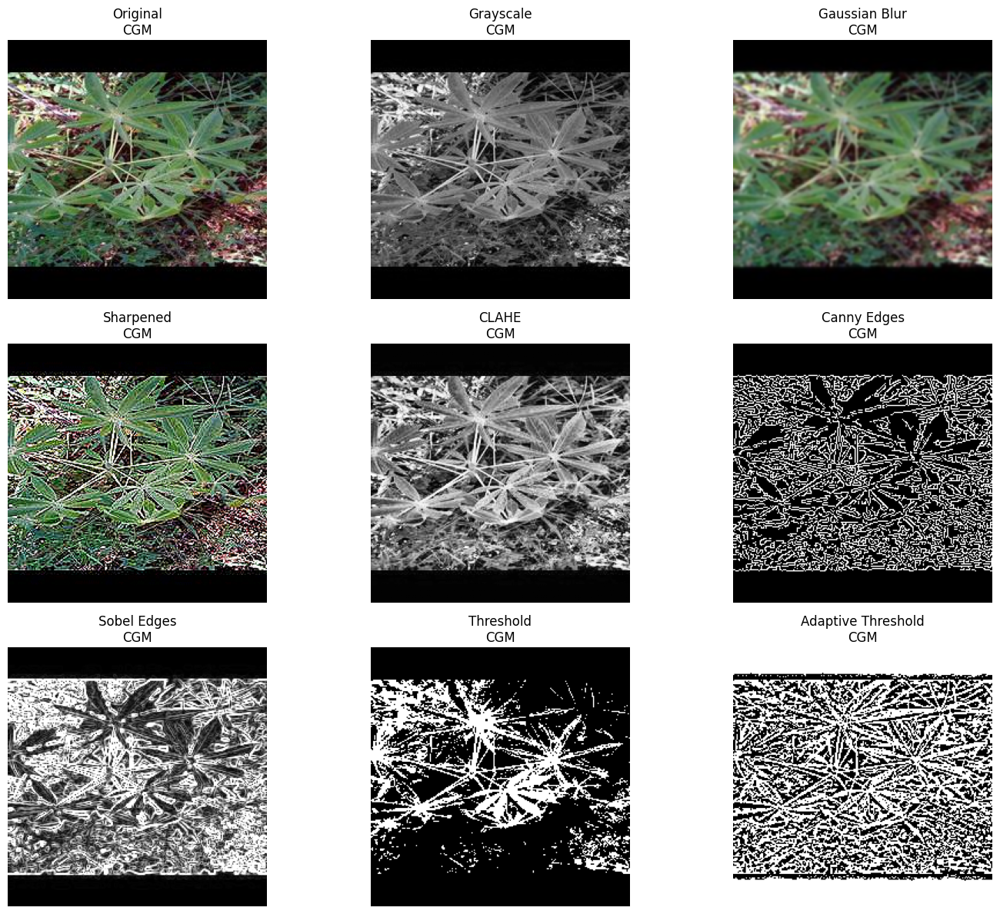

In [ ]:
images = [
    ("Original", resized, None),
    ("Grayscale", gray, "gray"),
    ("Gaussian Blur", gaussian_blur, None),
    ("Sharpened", sharpened, None),
    ("CLAHE", clahe_img, "gray"),
    ("Canny Edges", edges, "gray"),
    ("Sobel Edges", sobel, "gray"),
    ("Threshold", threshold, "gray"),
    ("Adaptive Threshold", adaptive_threshold, "gray")
]

plt.figure(figsize=(15, 12))

for i, (title, image, cmap) in enumerate(images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image, cmap=cmap)
    plt.title(f"{title}\n{label_name}")
    plt.axis("off")

plt.tight_layout()
plt.show()

HSV color space




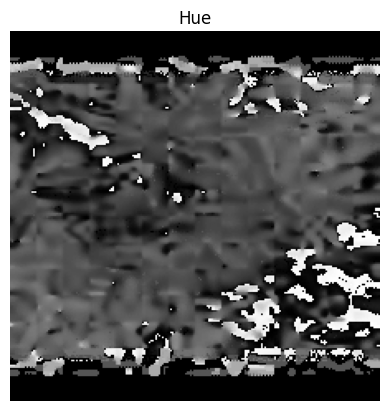

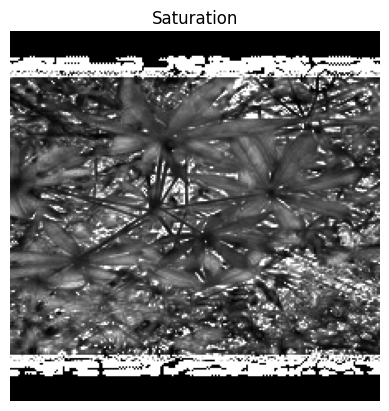

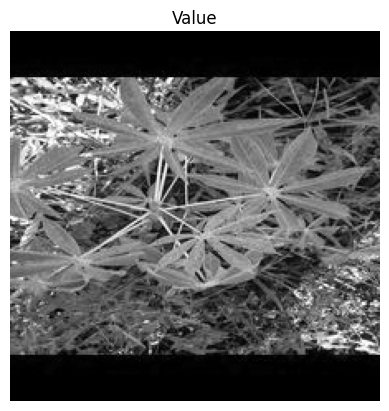

In [ ]:
import matplotlib.pyplot as plt

def show_image(title, image, cmap=None):
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

show_image("Hue", h, "gray")
show_image("Saturation", s, "gray")
show_image("Value", v, "gray")

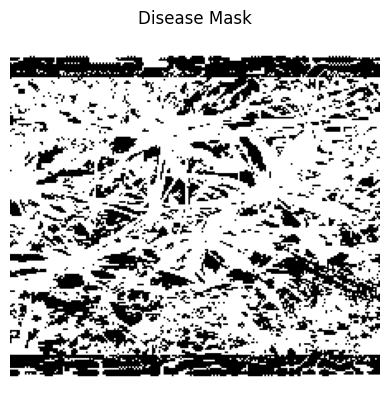

In [ ]:
_, mask = cv2.threshold(s, 100, 255, cv2.THRESH_BINARY_INV)
show_image("Disease Mask", mask, "gray")

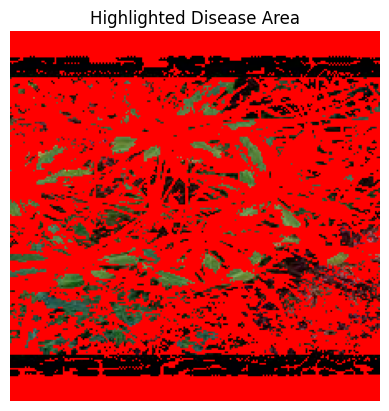

In [ ]:
highlight = resized.copy()
highlight[mask == 255] = [255, 0, 0]

show_image("Highlighted Disease Area", highlight)

Morphological operation


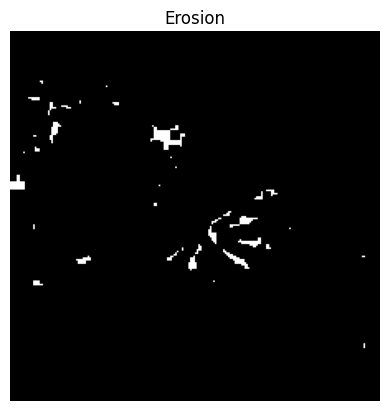

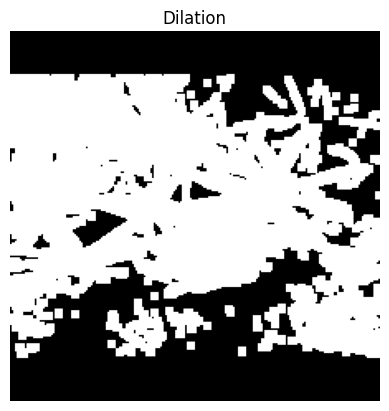

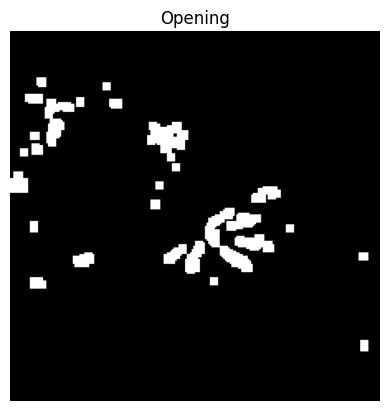

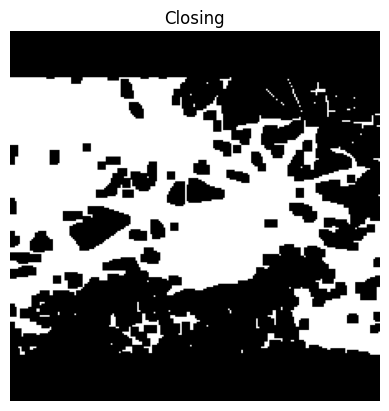

In [ ]:
kernel = np.ones((5,5), np.uint8)

erosion = cv2.erode(threshold, kernel, iterations=1)
dilation = cv2.dilate(threshold, kernel, iterations=1)
opening = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel)

show_image("Erosion", erosion, cmap="gray")
show_image("Dilation", dilation, cmap="gray")
show_image("Opening", opening, cmap="gray")
show_image("Closing", closing, cmap="gray")

RGB histogram

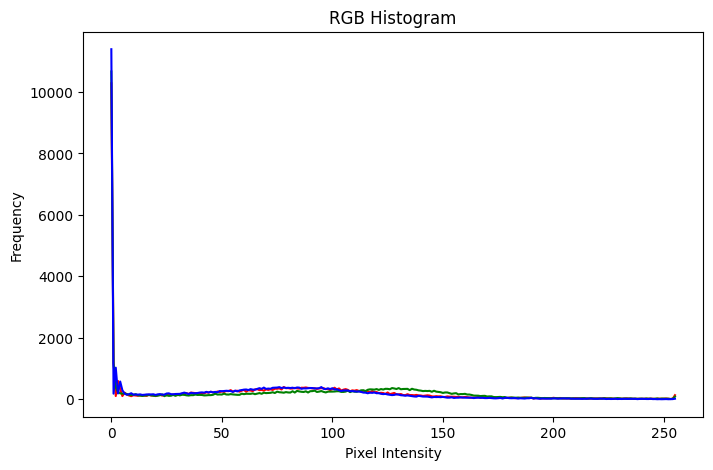

In [ ]:
colors = ("red", "green", "blue")

plt.figure(figsize=(8,5))

for i, color in enumerate(colors):
    hist = cv2.calcHist([resized], [i], None, [256], [0,256])
    plt.plot(hist, color=color)

plt.title("RGB Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

Data augmentation

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.15),
    tf.keras.layers.RandomZoom(0.15),
    tf.keras.layers.RandomContrast(0.1),
])

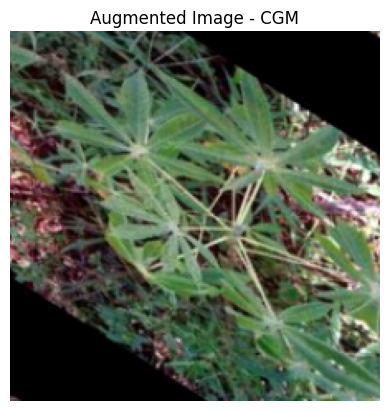

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# resize image first
resized = cv2.resize(img, (224, 224))

# convert to tensor and add batch dimension
image_tensor = tf.expand_dims(resized, axis=0)

# apply augmentation
augmented_image = data_augmentation(image_tensor)

# convert back to numpy
augmented_image = augmented_image[0].numpy().astype("uint8")

plt.imshow(augmented_image)
plt.title(f"Augmented Image - {label_name}")
plt.axis("off")
plt.show()

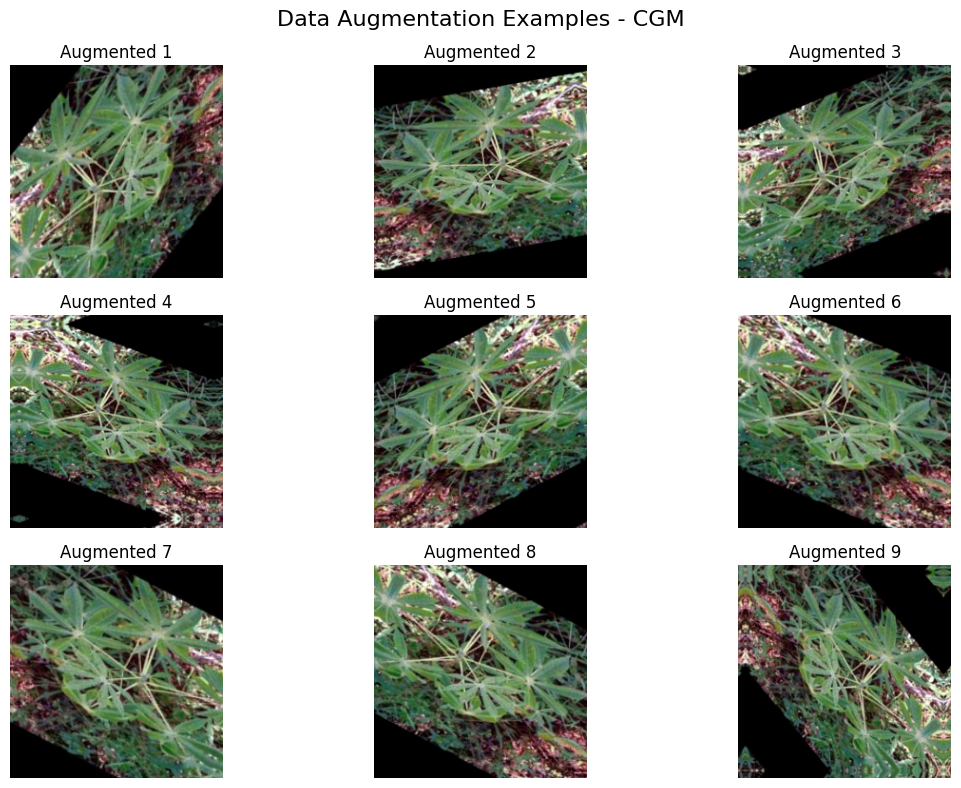

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(12, 8))

for i in range(9):
    augmented = data_augmentation(image_tensor)
    augmented = augmented[0].numpy().astype("uint8")

    plt.subplot(3, 3, i + 1)
    plt.imshow(augmented)
    plt.title(f"Augmented {i+1}")
    plt.axis("off")

plt.suptitle(f"Data Augmentation Examples - {label_name}", fontsize=16)
plt.tight_layout()
plt.show()

Build LMFR Net Model

In [ ]:
#Imports
import tensorflow as tf
from tensorflow.keras import layers, models

#LMFRNet Multi-Feature Block
def lmfr_block(x, filters):
    # Branch 1: 1x1 convolution
    b1 = layers.Conv2D(filters, (1, 1), padding="same", activation="relu")(x)

    # Branch 2: 3x3 convolution
    b2 = layers.Conv2D(filters, (3, 3), padding="same", activation="relu")(x)

    # Branch 3: depthwise separable convolution
    b3 = layers.SeparableConv2D(filters, (3, 3), padding="same", activation="relu")(x)

    # Combine features
    x = layers.Concatenate()([b1, b2, b3])

    # Reduce channels
    x = layers.Conv2D(filters, (1, 1), padding="same", activation="relu")(x)
    x = layers.BatchNormalization()(x)

    return x


#Build LMFRNet Model
def build_lmfrnet(input_shape=(224, 224, 3), num_classes=5):
    inputs = layers.Input(shape=input_shape)

    x = layers.Rescaling(1./255)(inputs)

    x = layers.Conv2D(32, (3, 3), padding="same", activation="relu")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = lmfr_block(x, 32)
    x = layers.MaxPooling2D((2, 2))(x)

    x = lmfr_block(x, 64)
    x = layers.MaxPooling2D((2, 2))(x)

    x = lmfr_block(x, 128)
    x = layers.MaxPooling2D((2, 2))(x)

    x = lmfr_block(x, 256)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.4)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs, outputs)

    return model

Create Model

In [ ]:
num_classes = len(label_map)

model = build_lmfrnet(
    input_shape=(224, 224, 3),
    num_classes=num_classes
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 224, 224,  │        896 │ rescaling[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 224, 224,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 112, 112,  │      1,056 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 112, 112,  │      9,248 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d    │ (None, 112, 112,  │      1,344 │ max_pooling2d[0]… │
│ (SeparableConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 112, 112,  │          0 │ conv2d_1[0][0],   │
│ (Concatenate)       │ 96)               │            │ conv2d_2[0][0],   │
│                     │                   │            │ separable_conv2d… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 112, 112,  │      3,104 │ concatenate[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        128 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 56, 56,    │      2,112 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 56, 56,    │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_1  │ (None, 56, 56,    │      2,400 │ max_pooling2d_1[… │
│ (SeparableConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 56, 56,    │          0 │ conv2d_4[0][0],   │
│ (Concatenate)       │ 192)              │            │ conv2d_5[0][0],   │
│                     │                   │            │ separable_conv2d

 Total params: 753,925 (2.88 MB)

 Trainable params: 752,901 (2.87 MB)

 Non-trainable params: 1,024 (4.00 KB)

Important Dataset Loader


In [ ]:
layers.Rescaling(1./255)

<Rescaling name=rescaling_1, built=False>

In [ ]:
def load_image_lmfrnet(img_name, label, image_dir):
    image_path = tf.strings.join([image_dir, "/", img_name])

    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = tf.cast(img, tf.float32)

    return img, label

Create Dataset

In [ ]:
def make_dataset_lmfrnet(df, image_dir, shuffle=True):
    image_names = df["ID"].values
    labels = df["Labels"].astype(int).values

    ds = tf.data.Dataset.from_tensor_slices((image_names, labels))

    ds = ds.map(
        lambda img_name, label: load_image_lmfrnet(img_name, label, image_dir),
        num_parallel_calls=tf.data.AUTOTUNE
    )

    if shuffle:
        ds = ds.shuffle(1000)

    ds = ds.batch(32)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    return ds

In [ ]:
train_ds = make_dataset_lmfrnet(train_df, TRAIN_DIR, shuffle=True)
test_ds = make_dataset_lmfrnet(test_df, TEST_DIR, shuffle=False)

Train LMFRNet

In [ ]:
history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=30
)

Epoch 1/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 689s 4s/step - accuracy: 0.3475 - loss: 1.4977 - val_accuracy: 0.2000 - val_loss: 1.8090
Epoch 2/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - accuracy: 0.4090 - loss: 1.3882 - val_accuracy: 0.2090 - val_loss: 1.8694
Epoch 3/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - accuracy: 0.4293 - loss: 1.3491 - val_accuracy: 0.2160 - val_loss: 2.2462
Epoch 4/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - accuracy: 0.4555 - loss: 1.2925 - val_accuracy: 0.2780 - val_loss: 1.7254
Epoch 5/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - accuracy: 0.4715 - loss: 1.2481 - val_accuracy: 0.2360 - val_loss: 2.9329
Epoch 6/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - accuracy: 0.5272 - loss: 1.1832 - val_accuracy: 0.2670 - val_loss: 3.4955
Epoch 7/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - accuracy: 0.5520 - loss: 1.1270 - val_accuracy: 0.3270 - val_loss: 1.7595
Epoch 8/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - accuracy: 0.5645 - loss: 1.0

Training accuracy: 94%
Validation accuracy: 58%

This means overfitting, to resolve this we use following steps:-

Add Callbacks

In [ ]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        "best_lmfrnet.keras",
        monitor="val_accuracy",
        save_best_only=True,
        mode="max"
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_accuracy",
        patience=6,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.3,
        patience=3,
        min_lr=1e-7
    )
]

In [ ]:
history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    callbacks=callbacks
)

Epoch 1/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - accuracy: 0.9617 - loss: 0.1082 - val_accuracy: 0.5280 - val_loss: 2.3514 - learning_rate: 0.0010
Epoch 2/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 19s 135ms/step - accuracy: 0.9578 - loss: 0.1187 - val_accuracy: 0.5650 - val_loss: 2.0713 - learning_rate: 0.0010
Epoch 3/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 17s 118ms/step - accuracy: 0.9635 - loss: 0.1034 - val_accuracy: 0.5430 - val_loss: 2.2539 - learning_rate: 0.0010
Epoch 4/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - accuracy: 0.9705 - loss: 0.0826 - val_accuracy: 0.5460 - val_loss: 2.6932 - learning_rate: 0.0010
Epoch 5/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - accuracy: 0.9845 - loss: 0.0507 - val_accuracy: 0.5610 - val_loss: 2.5307 - learning_rate: 0.0010
Epoch 6/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 20s 141ms/step - accuracy: 0.9923 - loss: 0.0291 - val_accuracy: 0.5910 - val_loss: 2.0382 - learning_rate: 3.0000e-04
Epoch 7/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - accuracy:

Train ≈ 99%
Val ≈ 58%

Add softer augmentation

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.08),
    tf.keras.layers.RandomZoom(0.08),
    tf.keras.layers.RandomContrast(0.08),
])

Use improved LMFRNet with regularization


In [ ]:
from tensorflow.keras import layers, models, regularizers

def lmfr_block(x, filters, dropout_rate=0.15):
    b1 = layers.Conv2D(
        filters, 1, padding="same", activation="relu",
        kernel_regularizer=regularizers.l2(5e-5)
    )(x)

    b2 = layers.Conv2D(
        filters, 3, padding="same", activation="relu",
        kernel_regularizer=regularizers.l2(5e-5)
    )(x)

    b3 = layers.SeparableConv2D(
        filters, 3, padding="same", activation="relu",
        depthwise_regularizer=regularizers.l2(5e-5),
        pointwise_regularizer=regularizers.l2(5e-5)
    )(x)

    x = layers.Concatenate()([b1, b2, b3])

    x = layers.Conv2D(
        filters, 1, padding="same", activation="relu",
        kernel_regularizer=regularizers.l2(5e-5)
    )(x)

    x = layers.BatchNormalization()(x)
    x = layers.Dropout(dropout_rate)(x)

    return x

Build better LMFRNet


In [ ]:
def build_lmfrnet(input_shape=(224,224,3), num_classes=5):
    inputs = layers.Input(shape=input_shape)

    x = data_augmentation(inputs)
    x = layers.Rescaling(1./255)(x)

    x = layers.Conv2D(
        32, 3, padding="same", activation="relu",
        kernel_regularizer=regularizers.l2(5e-5)
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)

    x = lmfr_block(x, 32, 0.10)
    x = layers.MaxPooling2D()(x)

    x = lmfr_block(x, 64, 0.15)
    x = layers.MaxPooling2D()(x)

    x = lmfr_block(x, 128, 0.20)
    x = layers.MaxPooling2D()(x)

    x = lmfr_block(x, 128, 0.25)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.35)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return models.Model(inputs, outputs)

Create model:

In [ ]:
model = build_lmfrnet(
    input_shape=(224,224,3),
    num_classes=len(label_map)
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 224, 224,  │          0 │ input_layer_4[0]… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 224, 224,  │          0 │ sequential_3[0][… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 224, 224,  │        896 │ rescaling_3[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 224, 224,  │        128 │ conv2d_26[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_27 (Conv2D)  │ (None, 112, 112,  │      1,056 │ max_pooling2d_8[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_28 (Conv2D)  │ (None, 112, 112,  │      9,248 │ max_pooling2d_8[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_8  │ (None, 112, 112,  │      1,344 │ max_pooling2d_8[… │
│ (SeparableConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_8       │ (None, 112, 112,  │          0 │ conv2d_27[0][0],  │
│ (Concatenate)       │ 96)               │            │ conv2d_28[0][0],  │
│                     │                   │            │ separable_conv2d… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_29 (Conv2D)  │ (None, 112, 112,  │      3,104 │ concatenate_8[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        128 │ conv2d_29[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 112, 112,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 56, 56,    │          0 │ dropout_6[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_30 (Conv2D)  │ (None, 56, 56,    │      2,112 │ max_pooling2d_9[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_31 (Conv2D)  │ (None, 56, 56,    │     18,496 │ max_pooling2d_9[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 424,581 (1.62 MB)

 Trainable params: 423,813 (1.62 MB)

 Non-trainable params: 768 (3.00 KB)

use callbacks

In [ ]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        "best_lmfrnet.keras",
        monitor="val_accuracy",
        save_best_only=True,
        mode="max"
    ),

    tf.keras.callbacks.EarlyStopping(
        monitor="val_accuracy",
        patience=10,
        restore_best_weights=True,
        mode="max"
    ),

    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.3,
        patience=4,
        min_lr=1e-7
    )
]

Train again

In [ ]:
history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=50,
    callbacks=callbacks
)

Epoch 1/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 40s 230ms/step - accuracy: 0.3428 - loss: 1.5657 - val_accuracy: 0.2000 - val_loss: 1.7796 - learning_rate: 5.0000e-04
Epoch 2/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 28s 207ms/step - accuracy: 0.4008 - loss: 1.4725 - val_accuracy: 0.2000 - val_loss: 1.8001 - learning_rate: 5.0000e-04
Epoch 3/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 28s 210ms/step - accuracy: 0.4300 - loss: 1.4180 - val_accuracy: 0.2000 - val_loss: 2.7787 - learning_rate: 5.0000e-04
Epoch 4/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 29s 216ms/step - accuracy: 0.4425 - loss: 1.3868 - val_accuracy: 0.2530 - val_loss: 1.8190 - learning_rate: 5.0000e-04
Epoch 5/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 28s 211ms/step - accuracy: 0.4803 - loss: 1.3293 - val_accuracy: 0.3720 - val_loss: 1.5428 - learning_rate: 5.0000e-04
Epoch 6/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 42s 218ms/step - accuracy: 0.4980 - loss: 1.3074 - val_accuracy: 0.4350 - val_loss: 1.3892 - learning_rate: 5.0000e-04
Epoch 7/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 40s 21

Plot accuracy/loss

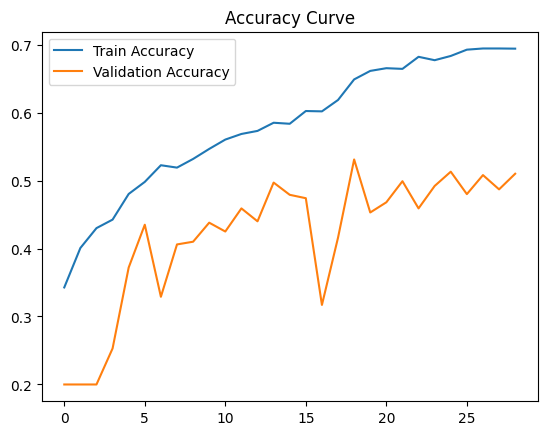

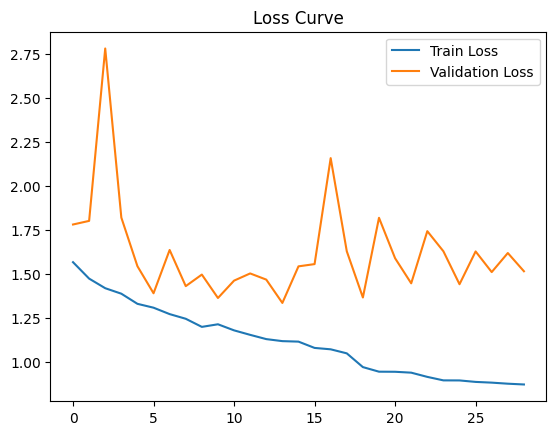

In [ ]:
plt.plot(history.history["accuracy"], label="Train Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.legend()
plt.title("Accuracy Curve")
plt.show()

plt.plot(history.history["loss"], label="Train Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.title("Loss Curve")
plt.show()

Load the best model

In [ ]:
model = tf.keras.models.load_model("best_lmfrnet.keras")

confusion matrix

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

cm = confusion_matrix(y_true, y_pred)

print(cm)
print(classification_report(y_true, y_pred))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100m

Heatmap

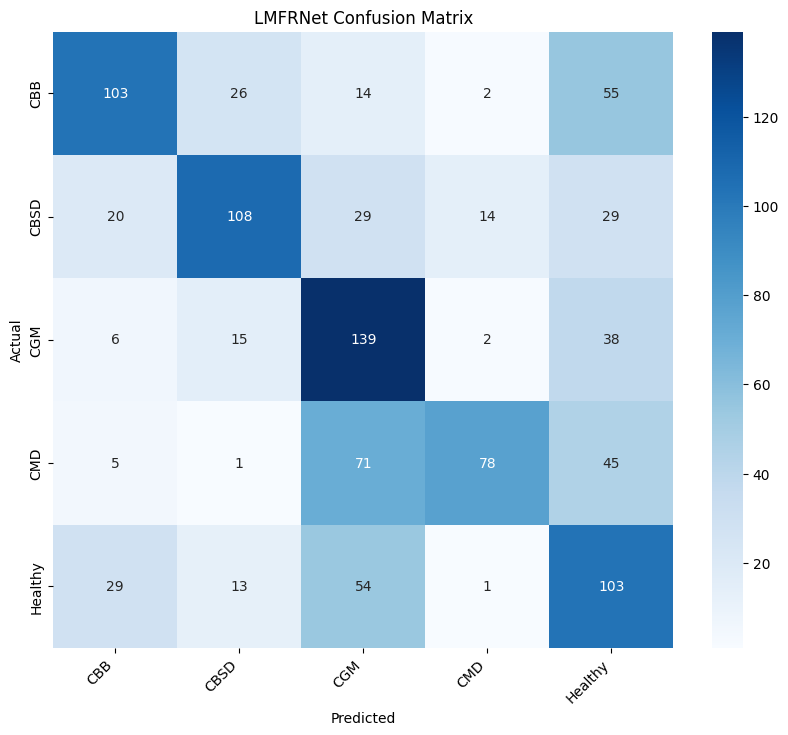

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

class_names = [label_map[str(i)] for i in range(len(label_map))]

plt.figure(figsize=(10, 8))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("LMFRNet Confusion Matrix")
plt.xticks(rotation=45, ha="right")
plt.show()

Predict on a SINGLE Image

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os

def predict_single_image(index):
    row = test_df.iloc[index]

    image_path = os.path.join(TEST_DIR, row["ID"])
    true_label_id = int(row["Labels"])
    true_label_name = label_map[str(true_label_id)]

    # load image
    img = Image.open(image_path).resize((224, 224))
    img_array = np.array(img)

    # IMPORTANT: same preprocessing as training
    img_array = img_array / 255.0   # because LMFRNet uses Rescaling(1./255)
    img_array = np.expand_dims(img_array, axis=0)

    # prediction
    pred = model.predict(img_array)
    pred_class = np.argmax(pred)
    confidence = np.max(pred)

    pred_label_name = label_map[str(pred_class)]

    # show result
    plt.imshow(img)
    plt.title(f"Pred: {pred_label_name} ({confidence:.2f})\nTrue: {true_label_name}")
    plt.axis("off")
    plt.show()

    print("Prediction:", pred_label_name)
    print("Confidence:", confidence)
    print("True Label:", true_label_name)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


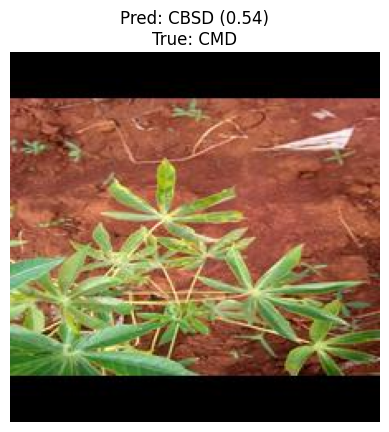

Prediction: CBSD
Confidence: 0.5404631
True Label: CMD
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


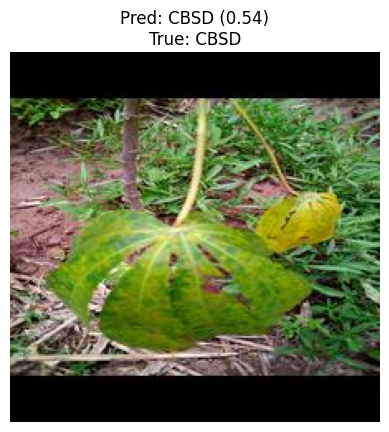

Prediction: CBSD
Confidence: 0.539734
True Label: CBSD


In [ ]:
predict_single_image(0)
predict_single_image(10)

Predict RANDOM Image

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


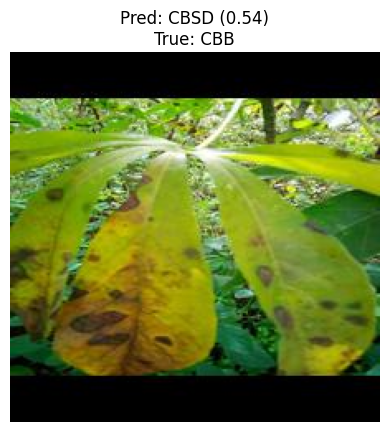

Prediction: CBSD
Confidence: 0.53992164
True Label: CBB


In [ ]:
import random

def predict_random():
    idx = random.randint(0, len(test_df)-1)
    predict_single_image(idx)

predict_random()

Predict MULTIPLE Images (Grid View)


In [ ]:
def predict_multiple(n=6):
    plt.figure(figsize=(12,8))

    for i in range(n):
        idx = np.random.randint(0, len(test_df))
        row = test_df.iloc[idx]

        image_path = os.path.join(TEST_DIR, row["ID"])
        true_label = label_map[str(int(row["Labels"]))]

        img = Image.open(image_path).resize((224,224))
        img_array = np.array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)

        pred = model.predict(img_array)
        pred_class = np.argmax(pred)
        pred_label = label_map[str(pred_class)]

        plt.subplot(2, n//2, i+1)
        plt.imshow(img)
        plt.title(f"P: {pred_label}\nT: {true_label}", fontsize=10)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


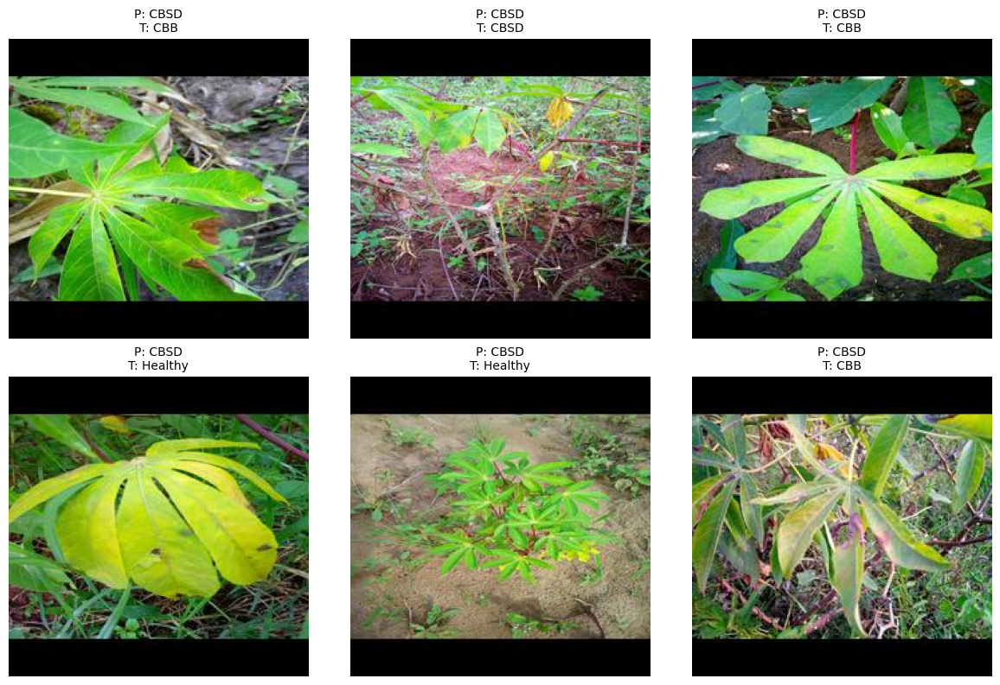

In [ ]:
predict_multiple(6)

Predict Entire Dataset (for confusion matrix)




In [ ]:
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)

    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

print("Done predicting")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/

Accuracy Check


In [ ]:
from sklearn.metrics import accuracy_score

print("Accuracy:", accuracy_score(y_true, y_pred))

Accuracy: 0.531
